## **Read XML FIle**

In [6]:
import xml.etree.ElementTree as ET 
import pandas as pd
tree = ET.parse('Melli.xml') 
root = tree.getroot() 
data = []
boxes = []
for i in range(6, 17):
  data.append([root[i][0].text, root[i][4][0].text, root[i][4][1].text, root[i][4][2].text, root[i][4][3].text].copy())
  boxes.append([int(root[i][4][0].text), int(root[i][4][1].text), int(root[i][4][2].text), int(root[i][4][3].text)].copy())
df = pd.DataFrame(data) 
df.columns = ["Label", "xmin", "ymin", "xmax", "ymax"]
print(df)

   Label xmin ymin  xmax ymax
0   Face  145  273   217  372
1   Face  162  130   236  218
2   Face  321  132   398  226
3   Face  493   81   569  175
4   Face  677  125   749  226
5   Face  831  120   901  217
6   Face  994  104  1064  204
7   Face  315  255   389  364
8   Face  499  249   582  356
9   Face  710  234   781  334
10  Face  920  210   994  321


## Bounding Boxes

Original:


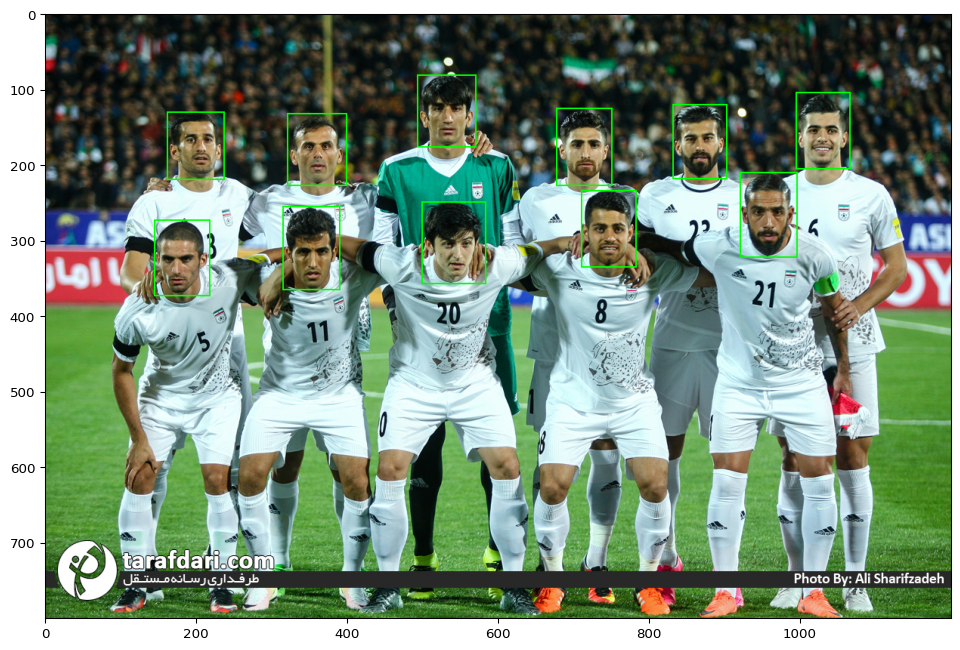

In [9]:
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
%matplotlib inline
melli_img = imageio.imread("Melli.jpg")
print("Original:")
# ia.imshow(image)
# image = ia.imresize_single_image(image, (298, 447))
l = []
for i in boxes:
  l.append(BoundingBox(x1=i[0], x2=i[2], y1=i[1], y2=i[3]))


bbs = BoundingBoxesOnImage(l, shape=melli_img.shape)

ia.imshow(bbs.draw_on_image(melli_img, size=2))

# **1) Affine with scale 0.7**

Augmented:


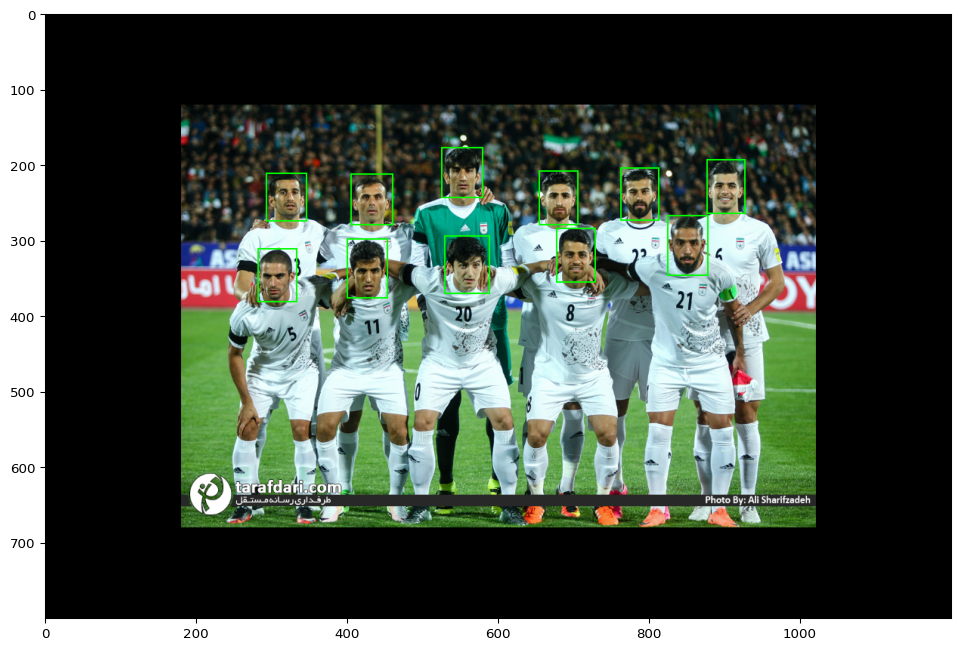

In [64]:
import imgaug.augmenters as iaa
ia.seed(4)

aug = iaa.Affine(scale=0.7)
image_aug, bbs_aug = aug(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug.draw_on_image(image_aug, size=2))

# **2)Affine with scale={"x": (0.2, 1.2), "y": (0.2, 1.2)}**

Augmented:


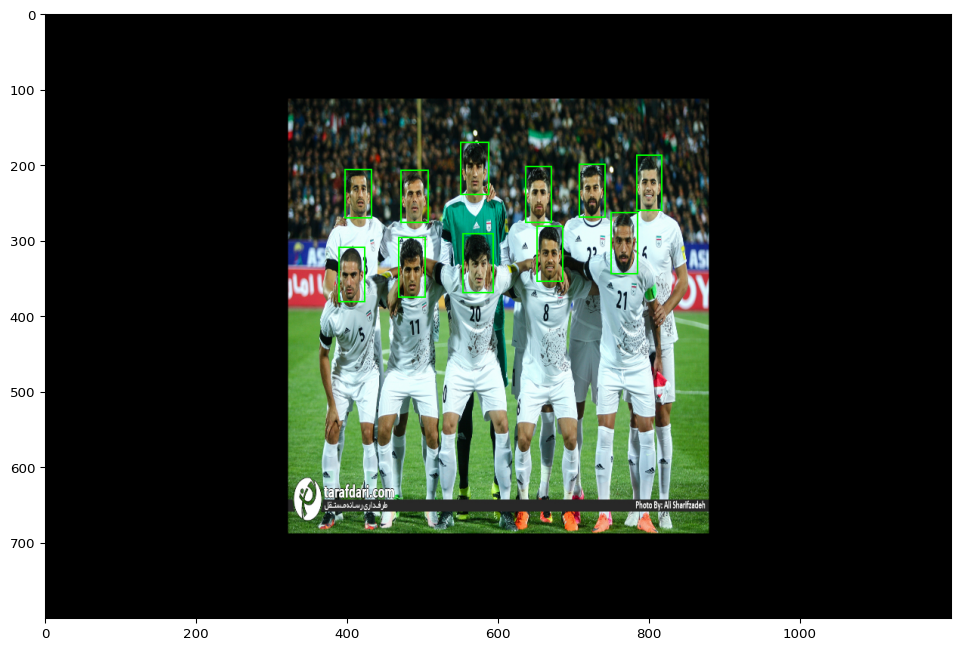

In [17]:
aug2 = iaa.Affine(scale={"x": (0.2, 1.2), "y": (0.2, 1.2)})
image_aug2, bbs_aug2 = aug2(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug2.draw_on_image(image_aug2, size=2))

# **3)Affine with translate_percent={"x": (-0.05, 0.4), "y": (-0.0.5, 0.4)}**

Augmented:


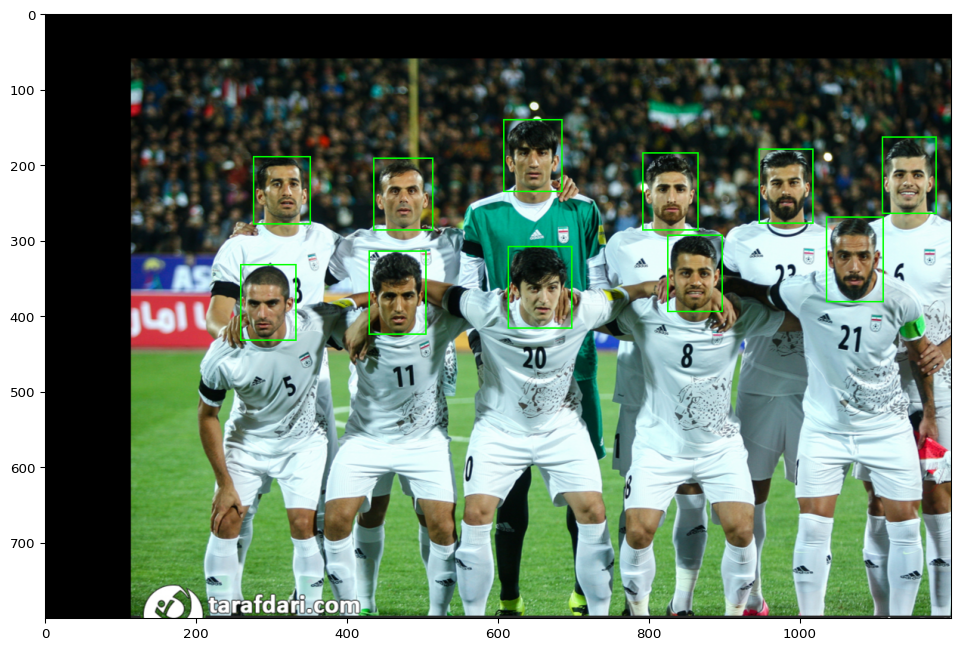

In [20]:
aug3 = iaa.Affine(translate_percent={"x": (-0.05, 0.4), "y": (-0.05, 0.4)})
image_aug3, bbs_aug3 = aug3(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug3.draw_on_image(image_aug3, size=2))

# **4)Affine with translate_px={"x": (-20, 25), "y": (-20, 25)}**

Augmented:


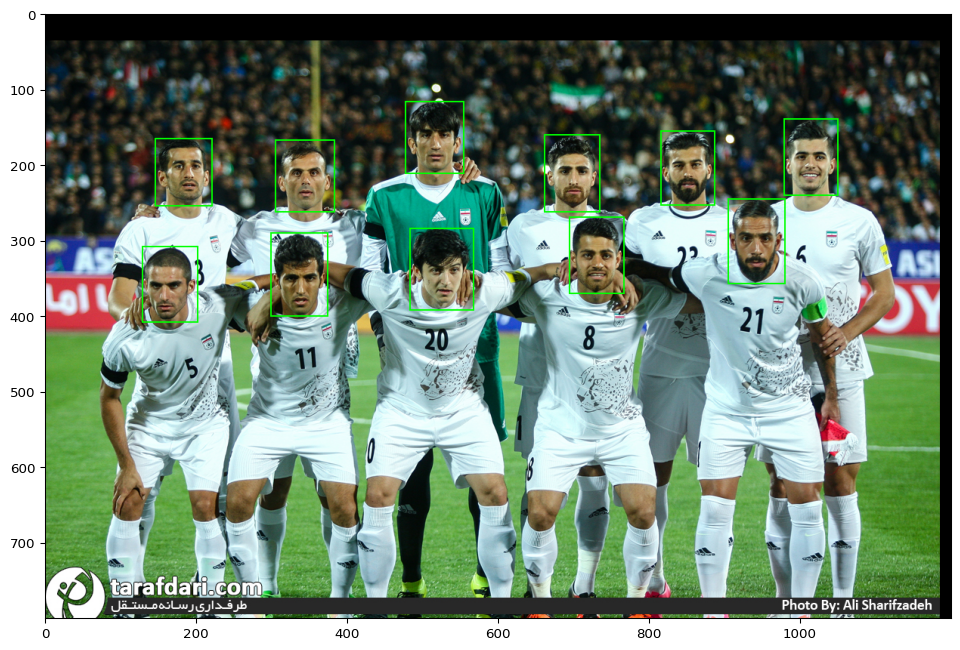

In [24]:
aug4 = iaa.Affine(translate_px={"x": (-40, 10), "y": (-40, 80)})
image_aug4, bbs_aug4 = aug4(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug4.draw_on_image(image_aug4, size=2))

# **5)Affine with rotate=(-45, 45)**

Augmented:


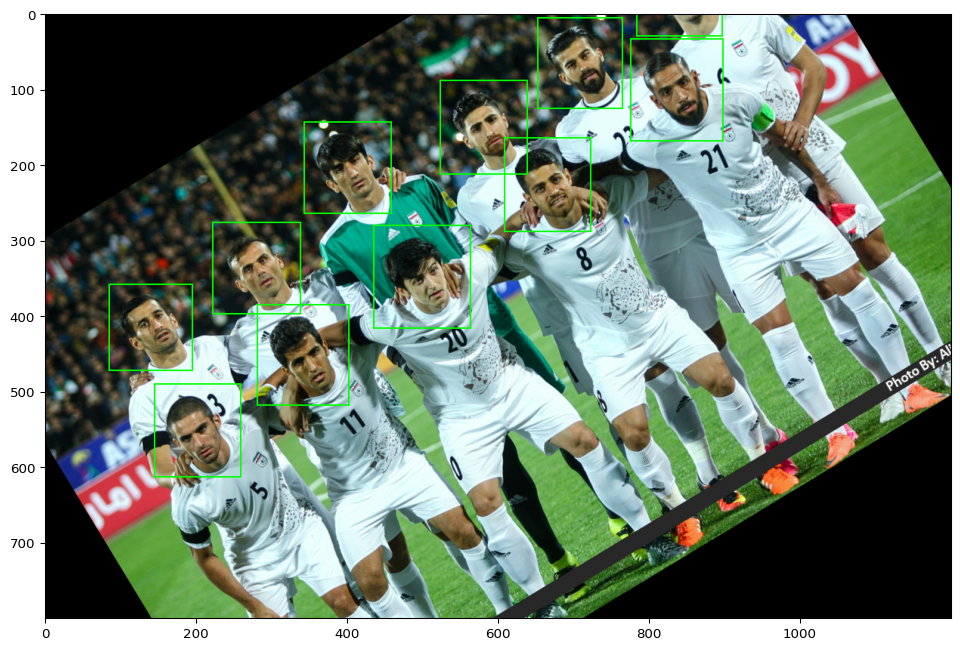

In [33]:
aug5 = iaa.Affine(rotate=(-45, 45))
image_aug5, bbs_aug5 = aug5(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug5.draw_on_image(image_aug5, size=2))

# **6)Affine with shear=(-20, 20)**

Augmented:


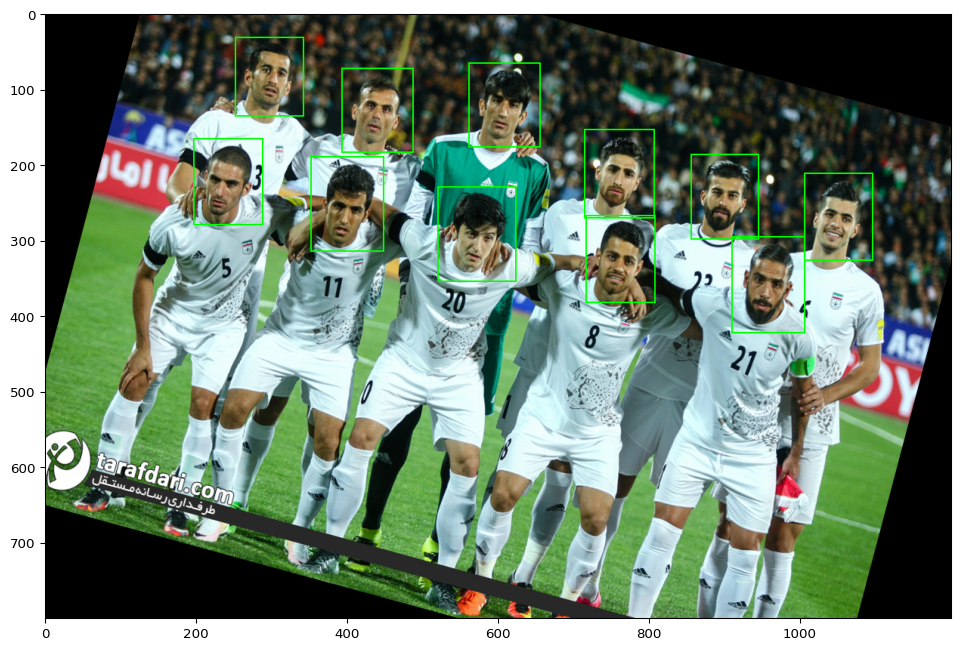

In [31]:
aug6 = iaa.Affine(shear=(-20, 20))
image_aug6, bbs_aug6 = aug6(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug6.draw_on_image(image_aug6, size=2))

# **7)Affine with translate_percent={"x": -0.60}, mode=ia.ALL, cval=(0, 255)**

Augmented:


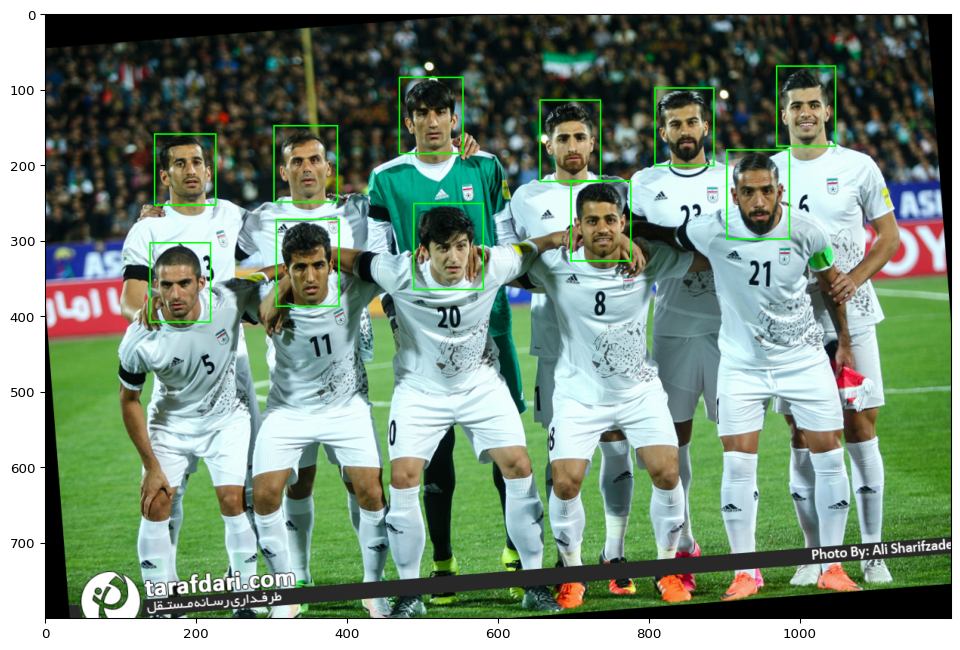

In [36]:
aug7 = iaa.Affine(translate_percent={"x": -0.60}, mode=ia.ALL, cval=(0, 255))
image_aug7, bbs_aug7 = aug6(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug7.draw_on_image(image_aug7, size=2))

# **8)ScaleX**

Augmented:


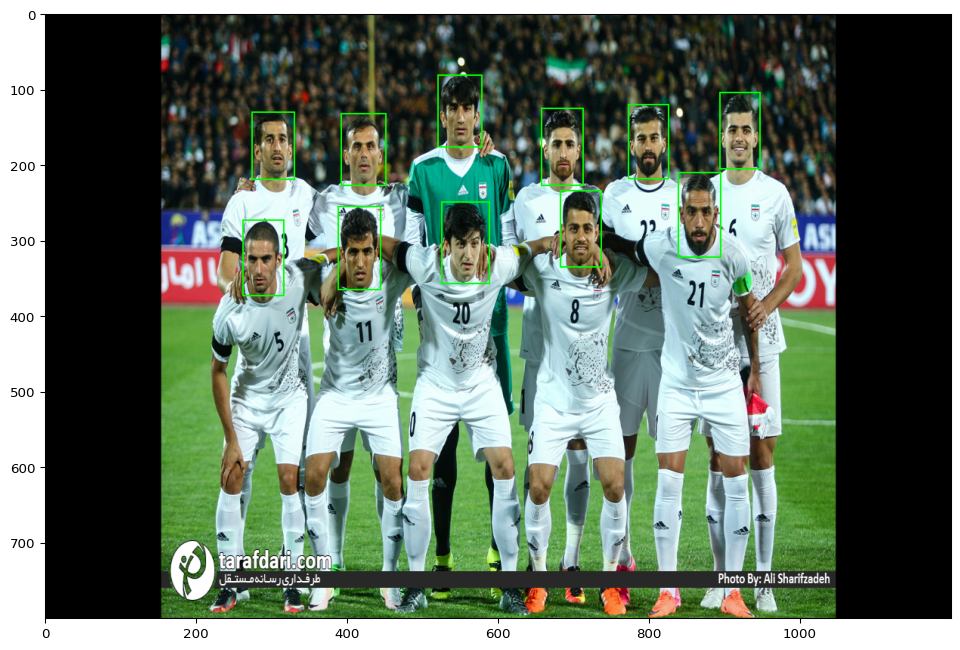

In [38]:
aug8 = iaa.ScaleX((1.5, 0.5))
image_aug8, bbs_aug8 = aug8(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug8.draw_on_image(image_aug8, size=2))

# **9)ScaleY**

Augmented:


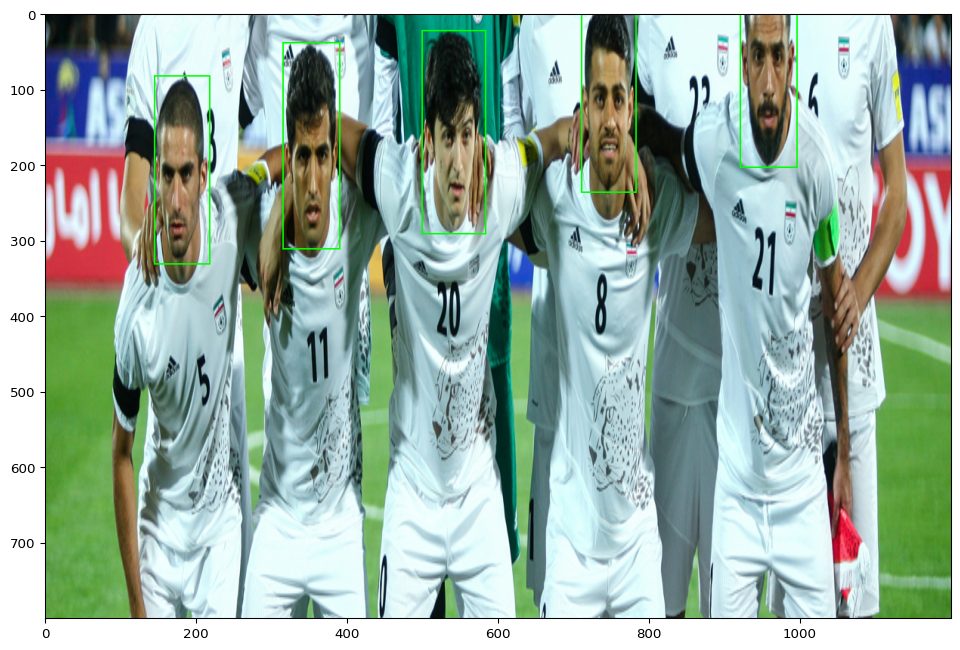

In [43]:
aug9 = iaa.ScaleY((2.5, 2.5))
image_aug9, bbs_aug9 = aug9(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug9.draw_on_image(image_aug9, size=2))

# **10)PiecewiseAffine**

Augmented:


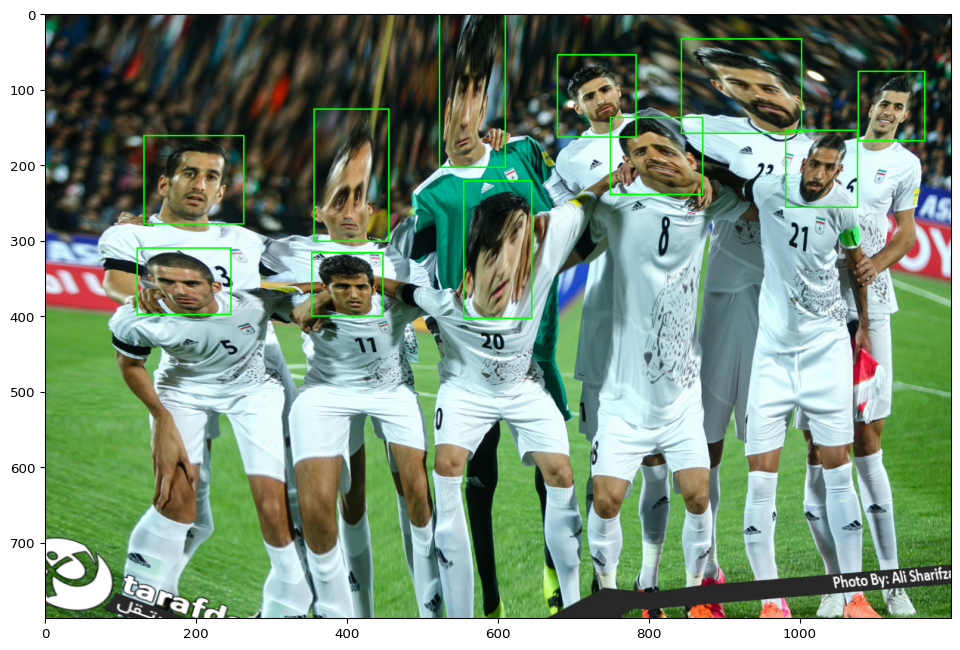

In [48]:
aug10 = iaa.PiecewiseAffine(scale=(0.08))
image_aug10, bbs_aug10 = aug10(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug10.draw_on_image(image_aug10, size=2))

## **11)PerspectiveTransform**

Augmented:


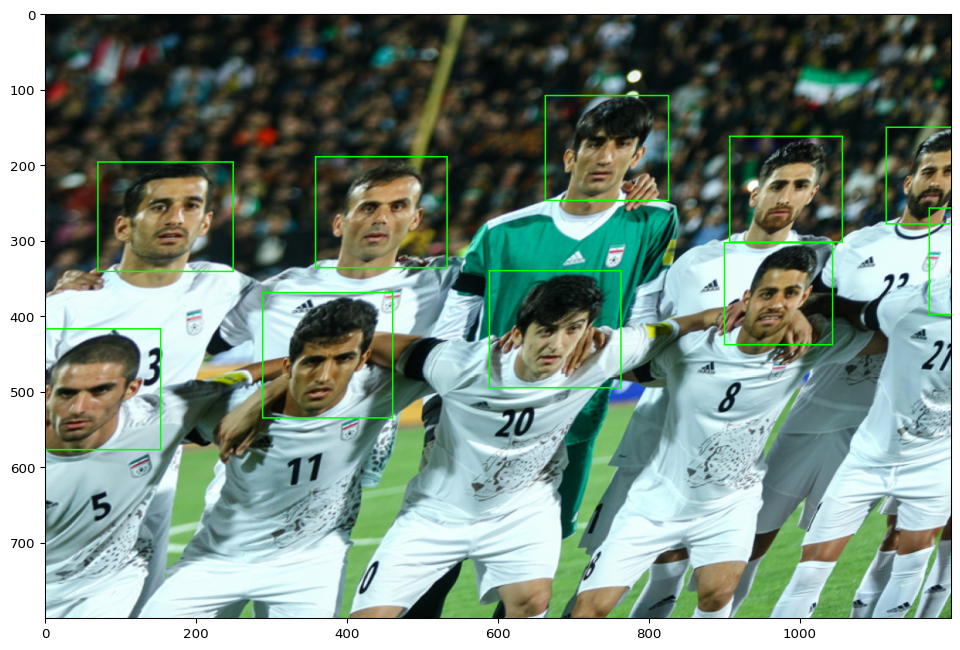

In [54]:
aug11 = iaa.PerspectiveTransform(scale=(0.2))
image_aug11, bbs_aug11 = aug11(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug11.draw_on_image(image_aug11, size=2))

# **12)ElasticTransformation**

Augmented:


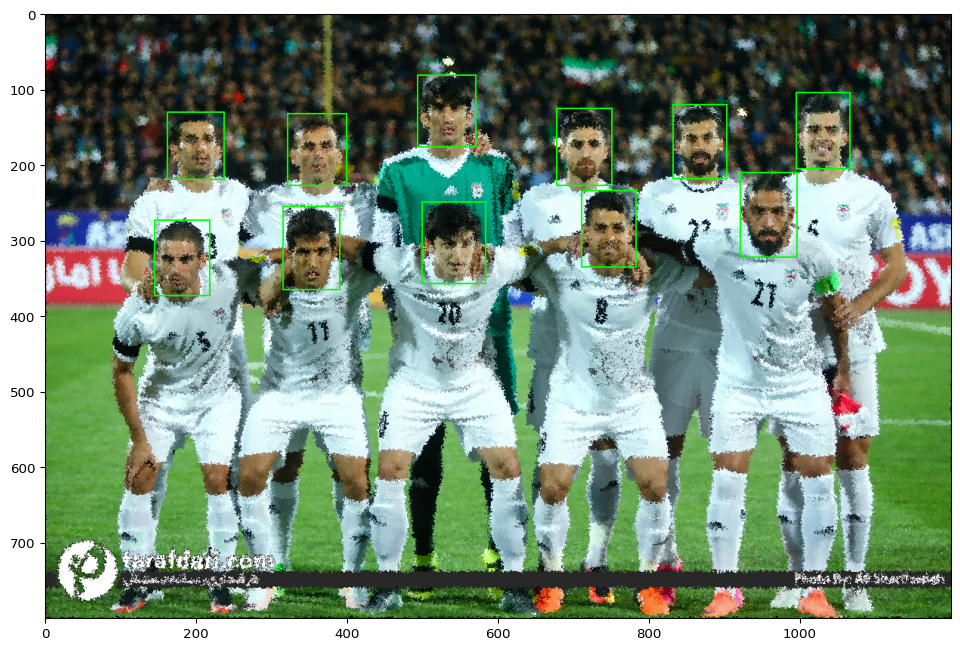

In [55]:
aug12 = iaa.ElasticTransformation(alpha=5, sigma=0.66)
image_aug12, bbs_aug12 = aug12(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug12.draw_on_image(image_aug12, size=2))

# **13)WithPolarWarping**

Augmented:


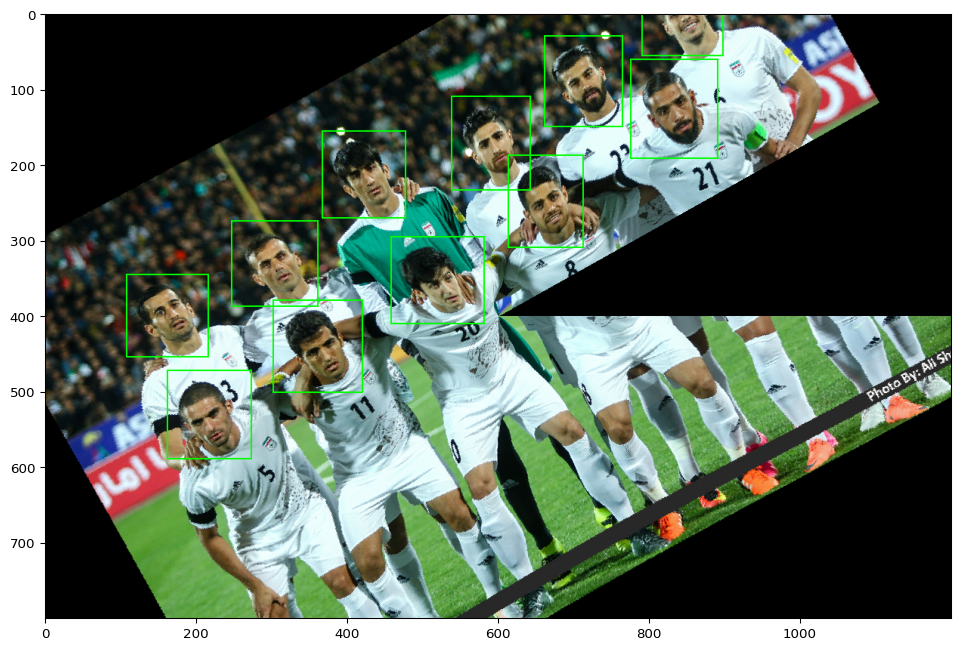

In [57]:
aug13 = iaa.WithPolarWarping(
    iaa.Affine(
        translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}
    )
)
image_aug13, bbs_aug13 = aug13(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug13.draw_on_image(image_aug13, size=2))

# **14)Jigsaw**

Augmented:


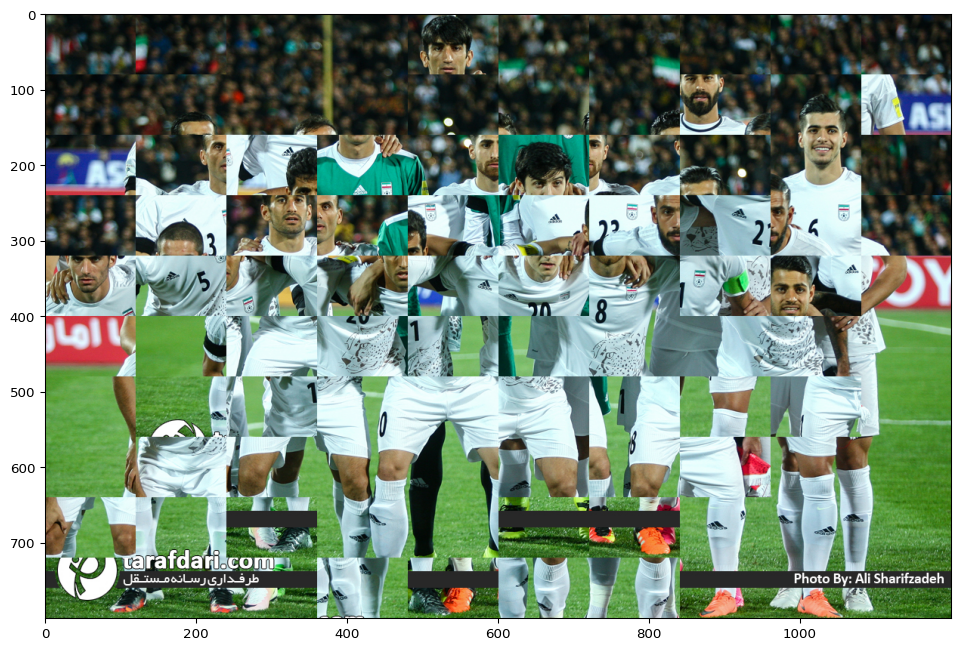

In [63]:
aug14 = iaa.Jigsaw(nb_rows=10, nb_cols=10, max_steps=(1, 5))
image_aug14= aug14(image=melli_img)
print("Augmented:")
ia.imshow(image_aug14)

Augmented:


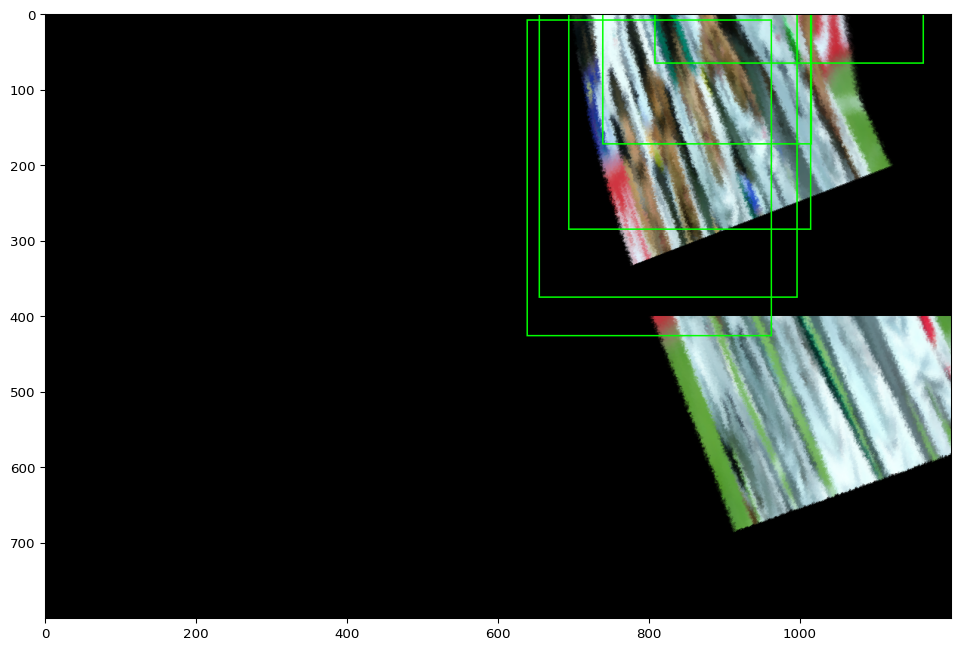

In [70]:
seq = iaa.Sequential([
    iaa.Affine(scale=0.7),
    iaa.Affine(scale={"x": (0.2, 1.2), "y": (0.2, 1.2)}),
    iaa.Affine(shear=(-20, 20)),
    iaa.Affine(translate_percent={"x": (-0.05, 0.4), "y": (-0.05, 0.4)}),
    # iaa.Affine(translate_px={"x": (-40, 10), "y": (-40, 80)}),
    iaa.Affine(rotate=(-45, 45)),
    iaa.Affine(shear=(-20, 20)),
    # iaa.Affine(translate_percent={"x": -0.60}, mode=ia.ALL, cval=(0, 255)),
    iaa.ScaleX((1.5, 0.5)),
    iaa.ScaleY((2.5, 2.5)),
    iaa.PiecewiseAffine(scale=(0.08)),
    iaa.PerspectiveTransform(scale=(0.2)),
    iaa.ElasticTransformation(alpha=5, sigma=0.66),
    iaa.WithPolarWarping(iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}))

])

image_aug15, bbs_aug15 = seq(image=melli_img, bounding_boxes=bbs)
print("Augmented:")
ia.imshow(bbs_aug15.draw_on_image(image_aug15, size=2))